# San Gabriel Mtns, CA, ROI #2

## Load *Streamlines* package

In [1]:
import streamlines

## Initiate *Streamlines* workflow

Choose the JSON parameters file we want to work with. The extension `.json` is automatically added.

In [2]:
JSON_parameters_file = 'SanGabrielMtns2'

Initialize streamline analysis.

In [3]:
sl = streamlines.run( parameters_file=JSON_parameters_file, \
                        do_geodata = False, \
                        do_preprocess = False, \
                        do_condition=True, \
                        do_trace = False, \
                        do_analysis=False, \
                        do_mapping=False, \
                        do_plot=False, \
                        do_display=True, \
                        do_save=False )


Sun 2018-08-12 10:52:49 JST+0900

**Initialization begin**
Loaded JSON parameters file "/Users/colinstark/Work/Streamlines/slm/json/SanGabrielMtns2.json"
slm git:
[['commit b151accf316db71acf6ca1e97116442648e2f7dc',
  'Author: Colin Stark',
  'Date:   Sun Aug 12 10:48:42 2018 +0900',
  '    Several key HSL improves: FM, ch %le thresholds, plot params; HSL '
  'solid']]
slmnb git:
[['commit ccd1021bece27428fe55ca122aea285a89787f08',
  'Author: Colin Stark',
  'Date:   Tue Jun 26 20:06:54 2018 +0900',
  '    Self sync: Big "bug" fixes: ch mapping, ridges & masking, HSL distbn"']]
slmdata git:
[['commit ebec4d15fce4f5291086f119daf4b4e8f842d9fb',
  'Author: Colin Stark',
  'Date:   Mon May 14 19:27:53 2018 +0900',
  '    Add Ikawa ROI; replace Gabilan DTMs w pit filled']]
**Initialization end**



## Import DTM

In [4]:
sl.geodata.do()


**Geodata begin**
Reading DTM from GeoTIFF file "/Users/colinstark/Work/Streamlines/slmdata/SanGabrielMtns/SanGabrielMtns2_res2m_fillsinks0p01.tif"
(402000.0, 2.0, 0.0, 3805000.0, 0.0, -2.0)
DTM size: 4952 x 5500 = 27,236,000 pixels
DTM pixel size: 2.0m
DTM origin:
  - bottom-left pixel center: [402000.00mE, 3794000.00mN]
  - bottom-left pixel corner: [401999.00mE, 3793999.00mN]


ERROR 1: NUMPY driver was compiled against GDAL 2.2, but the current library version is 2.4


ROI pixel bounds:  [[0, 4951], [0, 5499]]
ROI pixel grid:  4952 x 5500 = 27,236,000 pixels
ROI pixel-edge boundaries (assuming pixel-as-area)
  - in pixel units: [x: 0.0<=>4952.0] , [y: 0.0<=>5500.0]
  - in meters:      [x: 0.0<=>9904.0] , [y: 0.0<=>11000.0]
**Geodata end**



Recording figure "roi_shaded_relief"


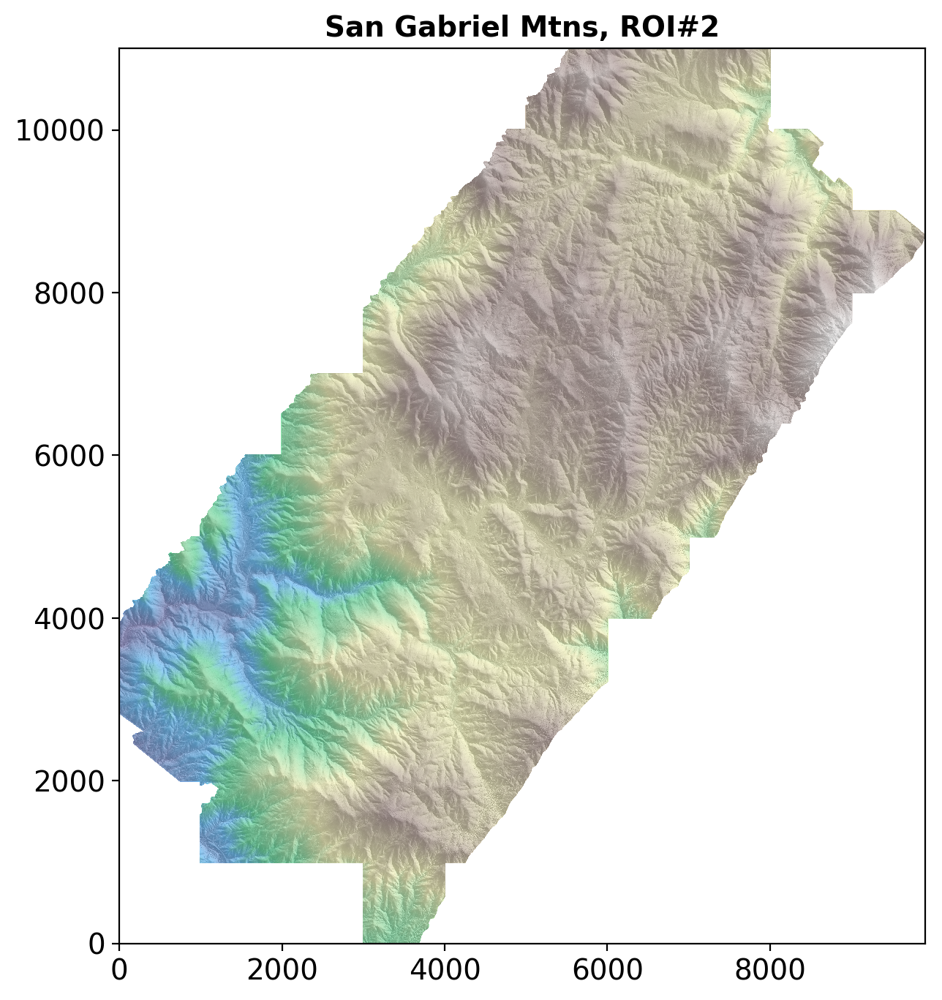

In [5]:
sl.plot.plot_roi_shaded_relief(interp_method='none')

## Preprocess DTM (fix loops etc)

In [6]:
sl.preprocess.do()


**Preprocess begin**
Precondition gradient vector field by fixing loops & blockages
Finding blockages...found 59453...done
Finding and fixing loops...
...done
Fixing blockages...
...done
Mask out bad uv pixels...done
**Preprocess end**



## Trace streamlines

In [7]:
%autosave 0
%time sl.trace.do()
%autosave 120

Autosave disabled

**Trace begin**
Integrating trajectories...
Generating seed points...shuffling...padding for 32 CL work items/group: 1000->1024...done
GPU/OpenCL device global memory limit for streamline trajectories: 3.6GB
GPU/OpenCL device memory required for streamline trajectories: 4MB => no need to chunkify
Total number of kernel instances: 1,024
Number of chunks = seed point array divisor: 1
Chunk size = number of kernel instances per chunk: 1,024
Downstream: downup=0 sgn(uv)=+1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Upstream:   downup=1 sgn(uv)=-1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Building streamlines compressed array
Streamlines actual array allocation:  size=2MB
Computing streamlines statistics
   downstream                           upstream                          
          min        mean          max       min         mean          max
l   25.106926  879.791748

Autosaving every 120 seconds


In [8]:
import pandas as pd
ddf=pd.DataFrame(sl.trace.traj_stats_df.loc['downstream'].T)
udf=pd.DataFrame(sl.trace.traj_stats_df.loc['upstream'].T)
ddf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Downstreamline statistics:')
udf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Upstreamline statistics:')

,min,mean,max
l,25.1,880,1e+03
n,28,954,1.09e+03
ds,0.889,0.922,0.932


,min,mean,max
l,2.93,920,1e+03
n,2,1.19e+03,2e+03
ds,0.0341,0.833,1.47


Autosave disabled
Plotting all 1,000 down streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%...53%...54%...55%...56%...57%...58%...59%...60%...61%...62%...63%...64%...65%...66%...67%...68%...69%...70%...71%...72%...73%...74%...75%...76%...77%...78%...79%...80%...81%...82%...83%...84%...85%...86%...87%...88%...89%...90%...91%...92%...93%...94%...95%...96%...97%...98%...99%...100%
Plotting all 1,000 up streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%..

Autosaving every 120 seconds


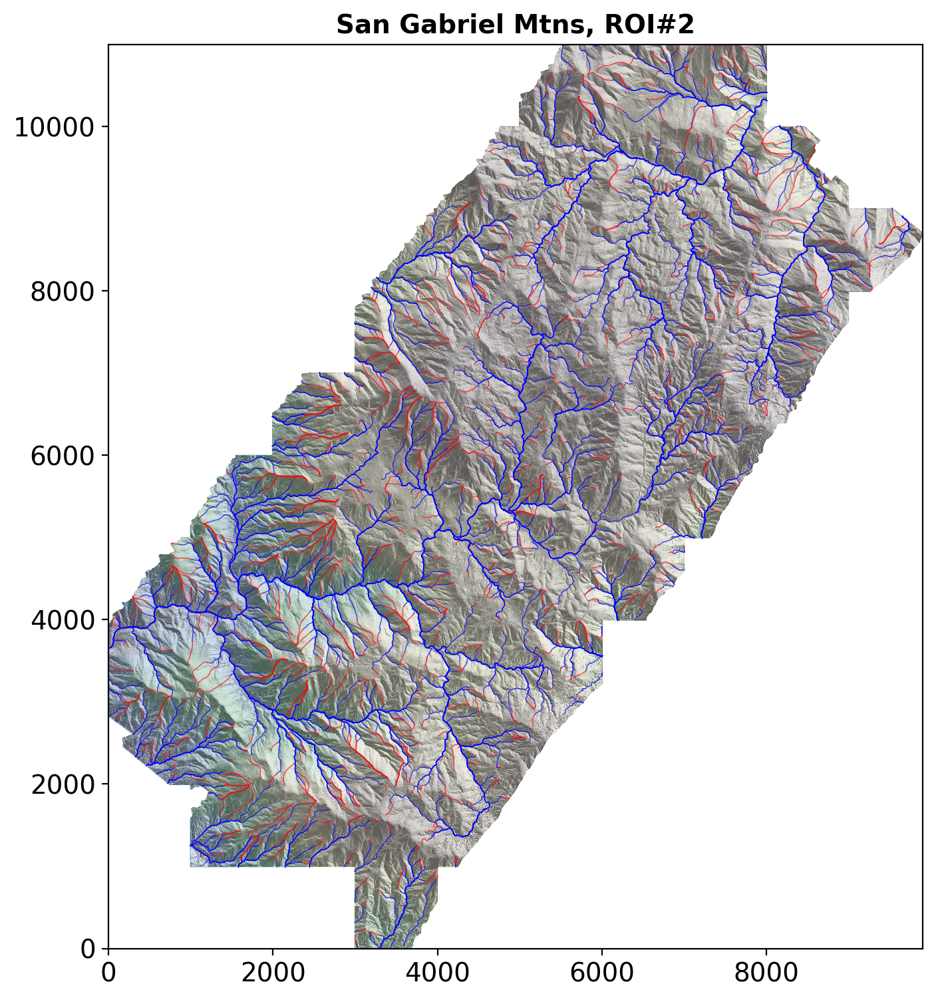

In [9]:
%autosave 0
sl.plot.plot_streamlines(window_size_factor=3)
%autosave 120

## Viz streamline flow concentrations

In [10]:
# sl.plot.plot_flow_maps(window_size_factor=3)

## Analyze streamline distributions

In [11]:
# sl.analysis.do()

In [12]:
# sl.plot.plot_distributions()

## Map channels, segments & hillslope lengths

In [13]:
sl.mapping.pass1()


**Pass#1 begin**
Channels...done
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Labeling confluences...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Segmenting channels...number of segments=677
...done
Linking hillslopes...
...done
Segmenting hillslopes...
...done
Subsegmenting left & right flanks...number of subsegments=1353
...done
Prepare for mapping HSL from midslopes
Midslopes...done
Ridges...done
**Pass#1 end**


In [14]:
sl.mapping.pass2()


**Pass#2 begin**
0.0% -676 
Channel threshold = 72.2m
FMM mean HSL   = 51.0m
Trace mean HSL = 64.6m
0.1% -675 
Channel threshold = 51.3m
FMM mean HSL   = 34.7m
Trace mean HSL = 44.8m
0.1% -674 
Channel threshold = 130.6m
FMM mean HSL   = 58.8m
Trace mean HSL = 82.5m
0.2% -673 
Channel threshold = 146.3m
FMM mean HSL   = 44.6m
Trace mean HSL = 83.9m
0.3% -672 
Channel threshold = 111.5m
FMM mean HSL   = 68.2m
Trace mean HSL = 97.0m
0.4% -671 
Channel threshold = 103.9m
FMM mean HSL   = 59.9m
Trace mean HSL = 71.2m
0.4% -670 
Channel threshold = 96.3m
FMM mean HSL   = 49.6m
Trace mean HSL = 65.5m
0.5% -669 
Channel threshold = 123.8m
FMM mean HSL   = 52.7m
Trace mean HSL = 71.2m
0.6% -668 
Channel threshold = 110.1m
FMM mean HSL   = 62.4m
Trace mean HSL = 82.3m
0.7% -667 
Channel threshold = 62.2m
FMM mean HSL   = 48.6m
Trace mean HSL = 57.2m
0.7% -666 
Channel threshold = 43.8m
FMM mean HSL   = 39.2m
Trace mean HSL = 48.7m
0.8% -665 
Channel threshold = 100.7m
FMM mean HSL   = 56.4m
Tr

7.2% -578 
Channel threshold = 121.7m
FMM mean HSL   = 37.8m
Trace mean HSL = 45.9m
7.3% -577 
Channel threshold = 105.6m
FMM mean HSL   = 40.7m
Trace mean HSL = 56.5m
7.4% -576 
Channel threshold = 32.2m
FMM mean HSL   = 25.8m
Trace mean HSL = 31.3m
7.5% -575 
Channel threshold = 108.4m
FMM mean HSL   = 53.1m
Trace mean HSL = 72.1m
7.5% -574 
Channel threshold = 98.0m
FMM mean HSL   = 37.9m
Trace mean HSL = 47.7m
7.6% -573 
Channel threshold = 85.0m
FMM mean HSL   = 47.9m
Trace mean HSL = 74.4m
7.7% -572 
Channel threshold = 199.7m
FMM mean HSL   = 18.0m
Trace mean HSL = 20.9m
7.8% -571 
Channel threshold = 150.0m
FMM mean HSL   = 23.3m
Trace mean HSL = 32.1m
7.8% -570 
Channel threshold = 95.6m
FMM mean HSL   = 51.1m
Trace mean HSL = 70.0m
7.9% -569 
Channel threshold = 74.9m
FMM mean HSL   = 35.9m
Trace mean HSL = 46.8m
8.0% -568 
Channel threshold = 98.0m
FMM mean HSL   = 29.5m
Trace mean HSL = 38.4m
8.1% -567 
Channel threshold = 55.7m
FMM mean HSL   = 32.3m
Trace mean HSL = 41.9m

14.5% -480 
Channel threshold = 59.8m
FMM mean HSL   = 36.5m
Trace mean HSL = 43.1m
14.6% -479 
Channel threshold = 80.7m
FMM mean HSL   = 39.6m
Trace mean HSL = 50.4m
14.6% -478 
Channel threshold = 70.5m
FMM mean HSL   = 40.5m
Trace mean HSL = 47.7m
14.7% -477 
Channel threshold = 100.5m
FMM mean HSL   = 41.2m
Trace mean HSL = 58.0m
14.8% -476 
Channel threshold = 71.2m
FMM mean HSL   = 43.8m
Trace mean HSL = 52.6m
14.9% -475 
Channel threshold = 245.5m
FMM mean HSL   = 19.7m
Trace mean HSL = 31.9m
14.9% -474 
Channel threshold = 99.1m
FMM mean HSL   = 52.0m
Trace mean HSL = 67.2m
15.0% -473 
Channel threshold = 107.5m
FMM mean HSL   = 53.6m
Trace mean HSL = 70.2m
15.1% -472    --- (problem measuring HSL using FM)
15.2% -471 
Channel threshold = 150.0m
FMM mean HSL   = 46.0m
Trace mean HSL = 51.5m
15.2% -470 
Channel threshold = 46.1m
FMM mean HSL   = 38.8m
Trace mean HSL = 46.7m
15.3% -469 
Channel threshold = 80.4m
FMM mean HSL   = 43.3m
Trace mean HSL = 55.5m
15.4% -468 
Channel t

Trace mean HSL = 79.6m
21.7% -382 
Channel threshold = 51.8m
FMM mean HSL   = 30.8m
Trace mean HSL = 39.2m
21.8% -381 
Channel threshold = 65.0m
FMM mean HSL   = 35.0m
Trace mean HSL = 47.7m
21.9% -380 
Channel threshold = 40.0m
FMM mean HSL   = 25.9m
Trace mean HSL = 33.2m
22.0% -379 
Channel threshold = 58.1m
FMM mean HSL   = 34.3m
Trace mean HSL = 44.5m
22.0% -378 
Channel threshold = 44.3m
FMM mean HSL   = 23.7m
Trace mean HSL = 31.3m
22.1% -377 
Channel threshold = 101.5m
FMM mean HSL   = 46.4m
Trace mean HSL = 62.9m
22.2% -376 
Channel threshold = 150.0m
FMM mean HSL   = 44.1m
Trace mean HSL = 79.5m
22.3% -375 
Channel threshold = 339.5m
FMM mean HSL   = 12.0m
Trace mean HSL = 12.6m
22.3% -374 
Channel threshold = 100.8m
FMM mean HSL   = 44.8m
Trace mean HSL = 56.6m
22.4% -373 
Channel threshold = 62.2m
FMM mean HSL   = 31.6m
Trace mean HSL = 39.7m
22.5% -372 
Channel threshold = 23.5m
FMM mean HSL   = 26.3m
Trace mean HSL = 29.8m
22.6% -371 
Channel threshold = 40.3m
FMM mean HS

28.9% -285 
Channel threshold = 150.0m
FMM mean HSL   = 8.5m
Trace mean HSL = 9.0m
29.0% -284 
Channel threshold = 209.1m
FMM mean HSL   = 19.3m
Trace mean HSL = 19.4m
29.1% -283 
Channel threshold = 64.1m
FMM mean HSL   = 40.6m
Trace mean HSL = 56.3m
29.1% -282 
Channel threshold = 55.5m
FMM mean HSL   = 44.3m
Trace mean HSL = 50.5m
29.2% -281 
Channel threshold = 71.0m
FMM mean HSL   = 44.8m
Trace mean HSL = 56.5m
29.3% -280 
Channel threshold = 106.5m
FMM mean HSL   = 49.5m
Trace mean HSL = 73.7m
29.4% -279 
Channel threshold = 73.3m
FMM mean HSL   = 52.4m
Trace mean HSL = 65.9m
29.4% -278 
Channel threshold = 57.5m
FMM mean HSL   = 42.0m
Trace mean HSL = 51.6m
29.5% -277 
Channel threshold = 150.0m
FMM mean HSL   = 25.7m
Trace mean HSL = 60.0m
29.6% -276 
Channel threshold = 65.0m
FMM mean HSL   = 46.4m
Trace mean HSL = 56.3m
29.7% -275 
Channel threshold = 144.9m
FMM mean HSL   = 59.2m
Trace mean HSL = 79.6m
29.7% -274 
Channel threshold = 46.6m
FMM mean HSL   = 33.1m
Trace mean H

36.1% -188 
Channel threshold = 257.2m
FMM mean HSL   = 65.7m
Trace mean HSL = 118.5m
36.2% -187 
Channel threshold = 69.2m
FMM mean HSL   = 39.6m
Trace mean HSL = 65.0m
36.2% -186 
Channel threshold = 146.4m
FMM mean HSL   = 82.9m
Trace mean HSL = 95.8m
36.3% -185 
Channel threshold = 73.7m
FMM mean HSL   = 40.0m
Trace mean HSL = 52.3m
36.4% -184 
Channel threshold = 208.0m
FMM mean HSL   = 67.0m
Trace mean HSL = 115.4m
36.5% -183 
Channel threshold = 80.3m
FMM mean HSL   = 45.7m
Trace mean HSL = 69.7m
36.5% -182 
Channel threshold = 70.6m
FMM mean HSL   = 59.9m
Trace mean HSL = 78.0m
36.6% -181 
Channel threshold = 100.4m
FMM mean HSL   = 48.8m
Trace mean HSL = 76.0m
36.7% -180 
Channel threshold = 107.8m
FMM mean HSL   = 91.5m
Trace mean HSL = 106.5m
36.8% -179 
Channel threshold = 129.3m
FMM mean HSL   = 59.9m
Trace mean HSL = 80.5m
36.8% -178 
Channel threshold = 249.1m
FMM mean HSL   = 92.5m
Trace mean HSL = 111.2m
36.9% -177 
Channel threshold = 242.3m
FMM mean HSL   = 99.9m
Tra

Trace mean HSL = 40.8m
43.3% -90 
Channel threshold = 68.4m
FMM mean HSL   = 45.6m
Trace mean HSL = 52.6m
43.3% -89 
Channel threshold = 71.9m
FMM mean HSL   = 43.1m
Trace mean HSL = 59.4m
43.4% -88 
Channel threshold = 96.8m
FMM mean HSL   = 43.5m
Trace mean HSL = 59.5m
43.5% -87 
Channel threshold = 102.9m
FMM mean HSL   = 62.9m
Trace mean HSL = 83.0m
43.6% -86 
Channel threshold = 69.9m
FMM mean HSL   = 33.5m
Trace mean HSL = 49.3m
43.6% -85 
Channel threshold = 41.5m
FMM mean HSL   = 46.1m
Trace mean HSL = 52.5m
43.7% -84 
Channel threshold = 115.6m
FMM mean HSL   = 42.7m
Trace mean HSL = 67.8m
43.8% -83 
Channel threshold = 175.2m
FMM mean HSL   = 64.0m
Trace mean HSL = 91.4m
43.9% -82 
Channel threshold = 48.1m
FMM mean HSL   = 27.0m
Trace mean HSL = 32.3m
43.9% -81 
Channel threshold = 83.9m
FMM mean HSL   = 55.9m
Trace mean HSL = 71.8m
44.0% -80 
Channel threshold = 67.3m
FMM mean HSL   = 44.7m
Trace mean HSL = 87.6m
44.1% -79 
Channel threshold = 92.2m
FMM mean HSL   = 45.2m
T

50.6% +10 
Channel threshold = 59.0m
FMM mean HSL   = 30.1m
Trace mean HSL = 33.5m
50.7% +11 
Channel threshold = 98.1m
FMM mean HSL   = 36.6m
Trace mean HSL = 46.8m
50.7% +12 
Channel threshold = 500.3m
FMM mean HSL   = 14.7m
Trace mean HSL = 15.0m
50.8% +13 
Channel threshold = 88.7m
FMM mean HSL   = 51.3m
Trace mean HSL = 64.2m
50.9% +14 
Channel threshold = 511.8m
FMM mean HSL   = 9.0m
Trace mean HSL = 9.7m
51.0% +15 
Channel threshold = 81.3m
FMM mean HSL   = 45.1m
Trace mean HSL = 65.7m
51.0% +16 
Channel threshold = 167.6m
FMM mean HSL   = 63.4m
Trace mean HSL = 84.7m
51.1% +17 
Channel threshold = 85.4m
FMM mean HSL   = 59.0m
Trace mean HSL = 76.4m
51.2% +18 
Channel threshold = 97.5m
FMM mean HSL   = 40.1m
Trace mean HSL = 56.2m
51.3% +19 
Channel threshold = 80.8m
FMM mean HSL   = 42.8m
Trace mean HSL = 57.6m
51.3% +20    --- (problem measuring HSL using FM)
51.4% +21 
Channel threshold = 54.0m
FMM mean HSL   = 27.4m
Trace mean HSL = 36.9m
51.5% +22 
Channel threshold = 70.3m

Trace mean HSL = 75.3m
58.0% +110 
Channel threshold = 97.8m
FMM mean HSL   = 54.0m
Trace mean HSL = 75.8m
58.1% +111 
Channel threshold = 539.5m
FMM mean HSL   = 32.0m
Trace mean HSL = 32.0m
58.1% +112 
Channel threshold = 124.2m
FMM mean HSL   = 33.9m
Trace mean HSL = 67.2m
58.2% +113 
Channel threshold = 93.7m
FMM mean HSL   = 40.0m
Trace mean HSL = 58.8m
58.3% +114 
Channel threshold = 150.0m
FMM mean HSL   = 20.6m
Trace mean HSL = 26.3m
58.4% +115 
Channel threshold = 179.8m
FMM mean HSL   = 45.6m
Trace mean HSL = 123.7m
58.4% +116 
Channel threshold = 101.5m
FMM mean HSL   = 37.0m
Trace mean HSL = 54.4m
58.5% +117    --- (problem measuring HSL using FM)
58.6% +118 
Channel threshold = 186.4m
FMM mean HSL   = 14.0m
Trace mean HSL = 15.1m
58.7% +119 
Channel threshold = 119.8m
FMM mean HSL   = 40.3m
Trace mean HSL = 58.0m
58.7% +120 
Channel threshold = 61.1m
FMM mean HSL   = 37.3m
Trace mean HSL = 46.3m
58.8% +121 
Channel threshold = 144.5m
FMM mean HSL   = 54.1m
Trace mean HSL =

Trace mean HSL = 39.4m
65.2% +208 
Channel threshold = 78.7m
FMM mean HSL   = 33.2m
Trace mean HSL = 43.7m
65.3% +209 
Channel threshold = 79.9m
FMM mean HSL   = 49.1m
Trace mean HSL = 60.5m
65.4% +210 
Channel threshold = 236.8m
FMM mean HSL   = 28.8m
Trace mean HSL = 36.1m
65.5% +211 
Channel threshold = 116.6m
FMM mean HSL   = 36.2m
Trace mean HSL = 56.0m
65.5% +212 
Channel threshold = 110.4m
FMM mean HSL   = 44.0m
Trace mean HSL = 58.1m
65.6% +213 
Channel threshold = 123.7m
FMM mean HSL   = 68.5m
Trace mean HSL = 104.9m
65.7% +214 
Channel threshold = 150.0m
FMM mean HSL   = 12.8m
Trace mean HSL = 13.7m
65.8% +215 
Channel threshold = 297.6m
FMM mean HSL   = 50.4m
Trace mean HSL = 103.9m
65.8% +216 
Channel threshold = 73.5m
FMM mean HSL   = 44.3m
Trace mean HSL = 56.8m
65.9% +217 
Channel threshold = 150.0m
FMM mean HSL   = 9.5m
Trace mean HSL = 6.5m
66.0% +218 
Channel threshold = 140.8m
FMM mean HSL   = 40.6m
Trace mean HSL = 59.5m
66.1% +219 
Channel threshold = 52.4m
FMM mea

72.4% +305 
Channel threshold = 119.6m
FMM mean HSL   = 59.6m
Trace mean HSL = 83.1m
72.5% +306 
Channel threshold = 82.6m
FMM mean HSL   = 42.2m
Trace mean HSL = 62.5m
72.6% +307 
Channel threshold = 95.4m
FMM mean HSL   = 48.3m
Trace mean HSL = 67.3m
72.6% +308 
Channel threshold = 98.5m
FMM mean HSL   = 35.7m
Trace mean HSL = 55.9m
72.7% +309 
Channel threshold = 192.0m
FMM mean HSL   = 10.5m
Trace mean HSL = 13.1m
72.8% +310 
Channel threshold = 64.8m
FMM mean HSL   = 45.5m
Trace mean HSL = 56.6m
72.9% +311 
Channel threshold = 150.0m
FMM mean HSL   = 29.0m
Trace mean HSL = 53.9m
72.9% +312 
Channel threshold = 150.0m
FMM mean HSL   = 19.2m
Trace mean HSL = 18.6m
73.0% +313 
Channel threshold = 96.4m
FMM mean HSL   = 59.7m
Trace mean HSL = 107.6m
73.1% +314 
Channel threshold = 80.7m
FMM mean HSL   = 33.7m
Trace mean HSL = 41.2m
73.2% +315 
Channel threshold = 787.9m
FMM mean HSL   = 16.8m
Trace mean HSL = 23.6m
73.2% +316 
Channel threshold = 150.0m
FMM mean HSL   = 16.4m
Trace me

79.6% +402 
Channel threshold = 72.4m
FMM mean HSL   = 45.0m
Trace mean HSL = 57.3m
79.7% +403 
Channel threshold = 194.1m
FMM mean HSL   = 71.2m
Trace mean HSL = 114.9m
79.7% +404 
Channel threshold = 63.5m
FMM mean HSL   = 28.5m
Trace mean HSL = 45.8m
79.8% +405 
Channel threshold = 60.7m
FMM mean HSL   = 40.9m
Trace mean HSL = 49.5m
79.9% +406 
Channel threshold = 64.8m
FMM mean HSL   = 42.4m
Trace mean HSL = 49.7m
80.0% +407 
Channel threshold = 62.0m
FMM mean HSL   = 36.8m
Trace mean HSL = 44.7m
80.0% +408 
Channel threshold = 97.4m
FMM mean HSL   = 31.8m
Trace mean HSL = 43.9m
80.1% +409 
Channel threshold = 131.9m
FMM mean HSL   = 46.8m
Trace mean HSL = 59.8m
80.2% +410 
Channel threshold = 370.8m
FMM mean HSL   = 10.5m
Trace mean HSL = 11.5m
80.3% +411 
Channel threshold = 40.1m
FMM mean HSL   = 30.4m
Trace mean HSL = 40.1m
80.3% +412 
Channel threshold = 150.0m
FMM mean HSL   = 6.0m
Trace mean HSL = 6.0m
80.4% +413 
Channel threshold = 39.4m
FMM mean HSL   = 32.0m
Trace mean H

FMM mean HSL   = 18.6m
Trace mean HSL = 20.2m
86.8% +500 
Channel threshold = 76.5m
FMM mean HSL   = 33.1m
Trace mean HSL = 44.7m
86.9% +501 
Channel threshold = 202.2m
FMM mean HSL   = 27.4m
Trace mean HSL = 37.8m
87.0% +502 
Channel threshold = 107.9m
FMM mean HSL   = 55.4m
Trace mean HSL = 71.2m
87.1% +503 
Channel threshold = 123.1m
FMM mean HSL   = 26.8m
Trace mean HSL = 41.7m
87.1% +504 
Channel threshold = 35.9m
FMM mean HSL   = 32.1m
Trace mean HSL = 38.7m
87.2% +505 
Channel threshold = 170.3m
FMM mean HSL   = 46.4m
Trace mean HSL = 83.1m
87.3% +506 
Channel threshold = 140.6m
FMM mean HSL   = 54.4m
Trace mean HSL = 88.8m
87.4% +507 
Channel threshold = 57.2m
FMM mean HSL   = 33.0m
Trace mean HSL = 39.7m
87.4% +508 
Channel threshold = 66.8m
FMM mean HSL   = 37.2m
Trace mean HSL = 44.9m
87.5% +509 
Channel threshold = 76.9m
FMM mean HSL   = 26.7m
Trace mean HSL = 38.1m
87.6% +510 
Channel threshold = 65.5m
FMM mean HSL   = 43.7m
Trace mean HSL = 54.7m
87.6% +511 
Channel thres

FMM mean HSL   = 79.0m
Trace mean HSL = 121.1m
94.0% +597 
Channel threshold = 150.0m
FMM mean HSL   = 19.8m
Trace mean HSL = 22.4m
94.1% +598 
Channel threshold = 83.8m
FMM mean HSL   = 52.4m
Trace mean HSL = 66.1m
94.2% +599 
Channel threshold = 43.4m
FMM mean HSL   = 37.0m
Trace mean HSL = 45.9m
94.2% +600 
Channel threshold = 280.2m
FMM mean HSL   = 70.2m
Trace mean HSL = 93.6m
94.3% +601 
Channel threshold = 57.3m
FMM mean HSL   = 38.5m
Trace mean HSL = 50.6m
94.4% +602 
Channel threshold = 90.2m
FMM mean HSL   = 31.7m
Trace mean HSL = 46.0m
94.5% +603 
Channel threshold = 142.6m
FMM mean HSL   = 65.1m
Trace mean HSL = 89.1m
94.5% +604 
Channel threshold = 148.8m
FMM mean HSL   = 39.1m
Trace mean HSL = 59.2m
94.6% +605 
Channel threshold = 59.0m
FMM mean HSL   = 34.5m
Trace mean HSL = 42.0m
94.7% +606 
Channel threshold = 150.0m
FMM mean HSL   = 18.8m
Trace mean HSL = 35.1m
94.7% +607 
Channel threshold = 122.5m
FMM mean HSL   = 57.9m
Trace mean HSL = 71.3m
94.8% +608 
Channel thr

In [15]:
sl.mapping.pass3()


**Pass#3 begin**
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Mapping hillslope lengths from midslopes...dilation with 51m (25-pixel) width filter...mean filtering with 60m (30-pixel) diameter disk...done
Computing hillslope aspect with median filter radii 4m (slope), 50m (uv)...done
Computing hillslope length-aspect function...done
Computing hillslope length-aspect statistics...done
**Pass#3 end**


## Viz channels & segments

Recording figure "channels"
Recording figure "label"


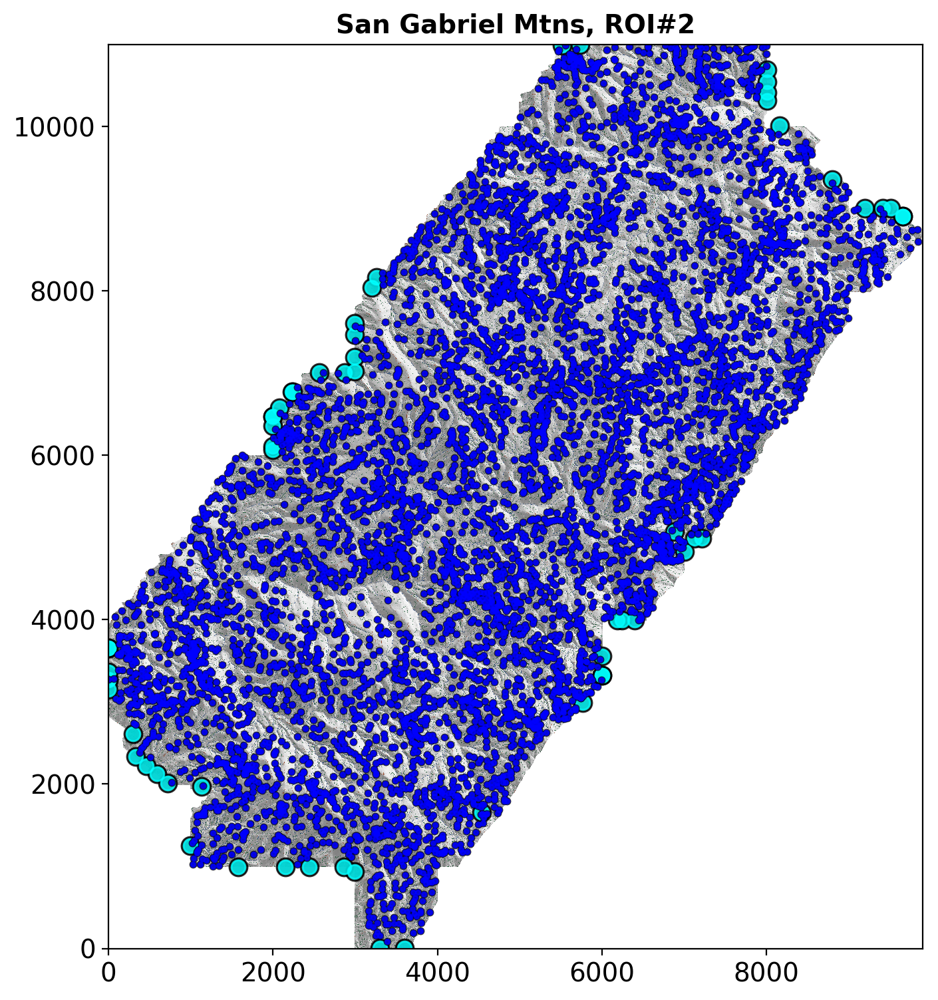

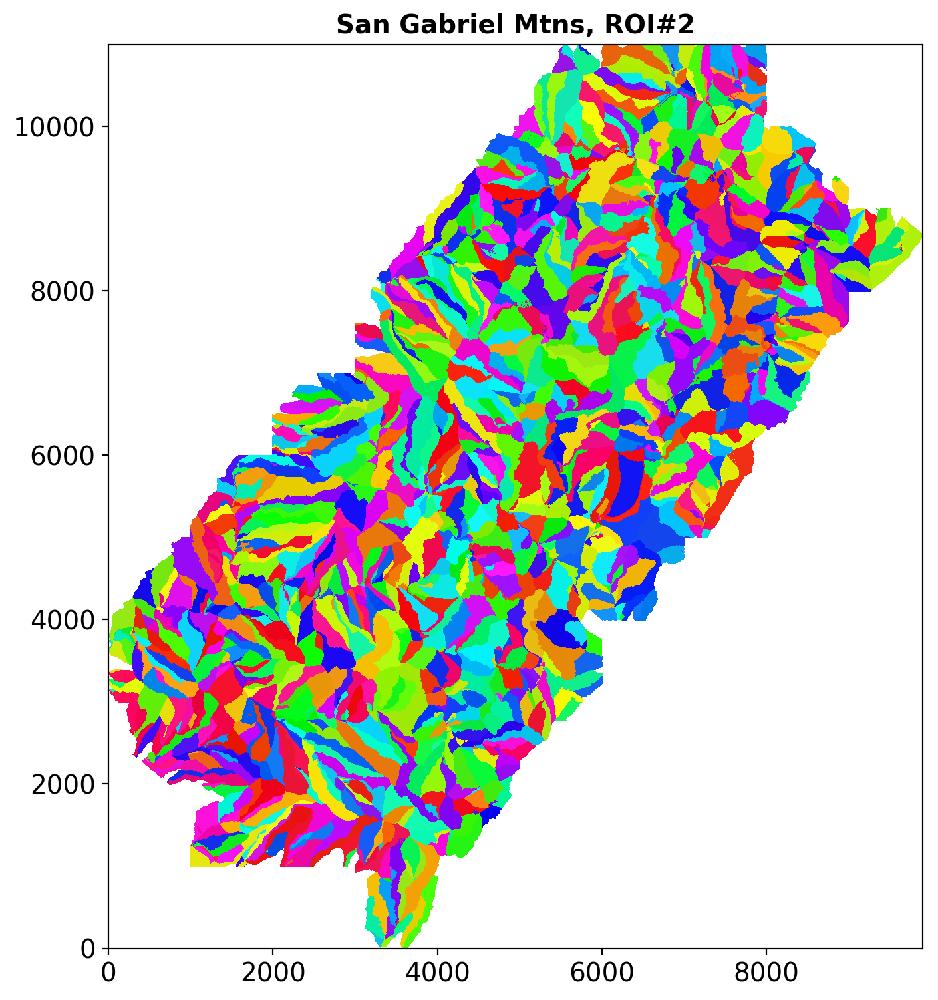

In [16]:
sl.plot.plot_channels(window_size_factor=3)
sl.plot.plot_segments(window_size_factor=3)

## Viz hillslope lengths

In [17]:
pctile=0.5
sl.plot.hsl_z_min=pctile
sl.plot.hsl_z_pctile=100-pctile
sl.plot.contour_hsl_z_min=pctile
sl.plot.contour_hsl_z_pctile=100-pctile

Recording figure "hsl"


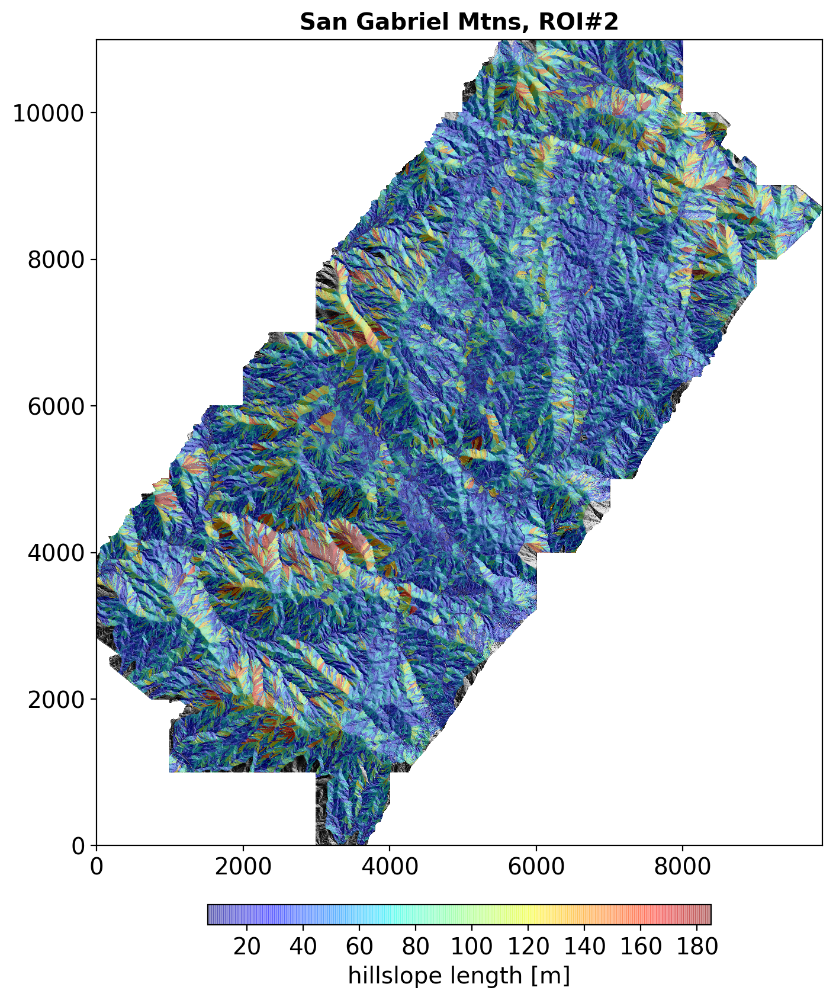

In [18]:
sl.plot.plot_hsl(window_size_factor=3.3)

Recording figure "hsl_contours"


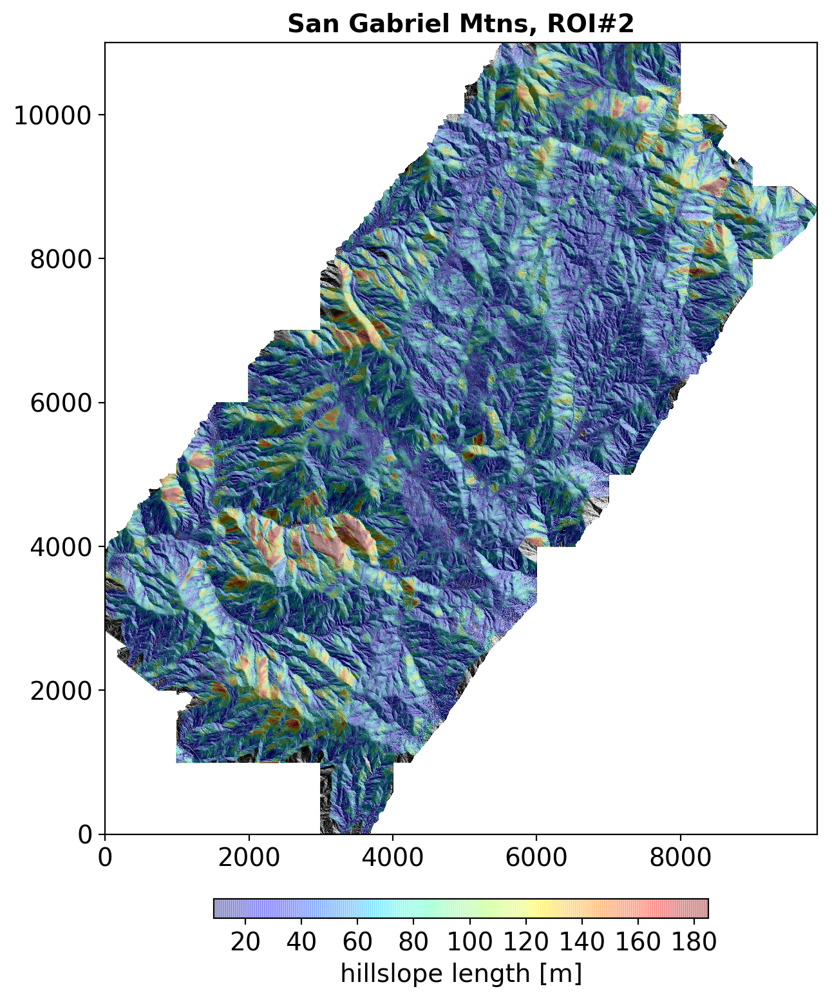

In [19]:
sl.plot.plot_hsl_contoured(window_size_factor=3)

## Viz aspect, hillslope length

Recording figure "aspect"


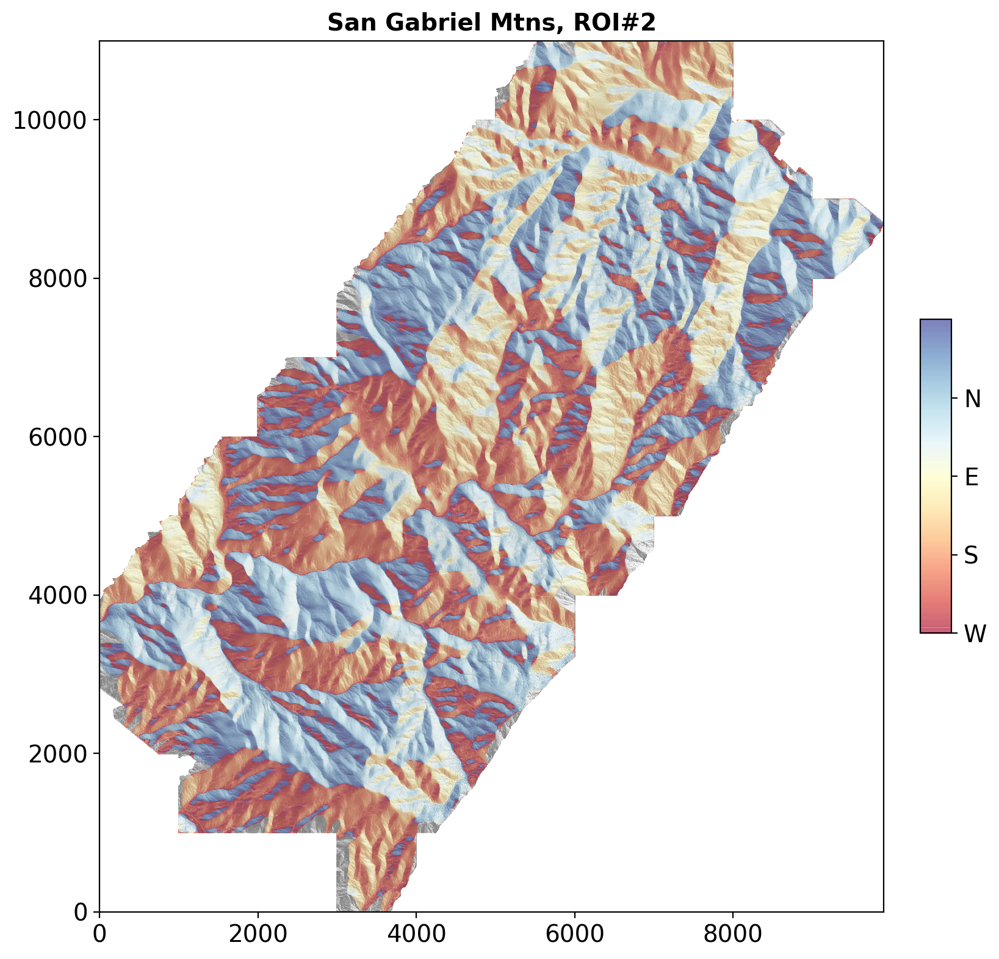

In [20]:
sl.plot.plot_aspect(window_size_factor=3.15)

In [21]:
sl.mapping.check_hsl_ns_disparity()

HSL mean ± σ(split), σ(all):	      63.0m ± 4.6m (split) 6.2m (all)
HSL N-S disparity:		      66.8mN vs 58.9mS   ∆≈7.9m
HSL N-S rel disparity vs variation:   12.6% (7.9m) NS vs 7.3% (4.6m)
HSL N-S disparity signal-noise ratio: ∆/σ = 1.7
					=> moderate north bias
N-facing vs S-facing HSL distribution comparison tests
  for f(HSL_N,S) with N,S bounds 45°<|±aspect|<135° from east
D_alpha =  c(alpha)*0.00709802
Kolmogorov-Smirnov: 0.34 p=0
Mann-Whitney:       0.30 p=0
Rank-sum:           95.7 p=0
Student's t:        108.9 p=0
Welch:              120.2 p=0
P-P:                +21%


Recording figure "hsl_aspect_distribution"


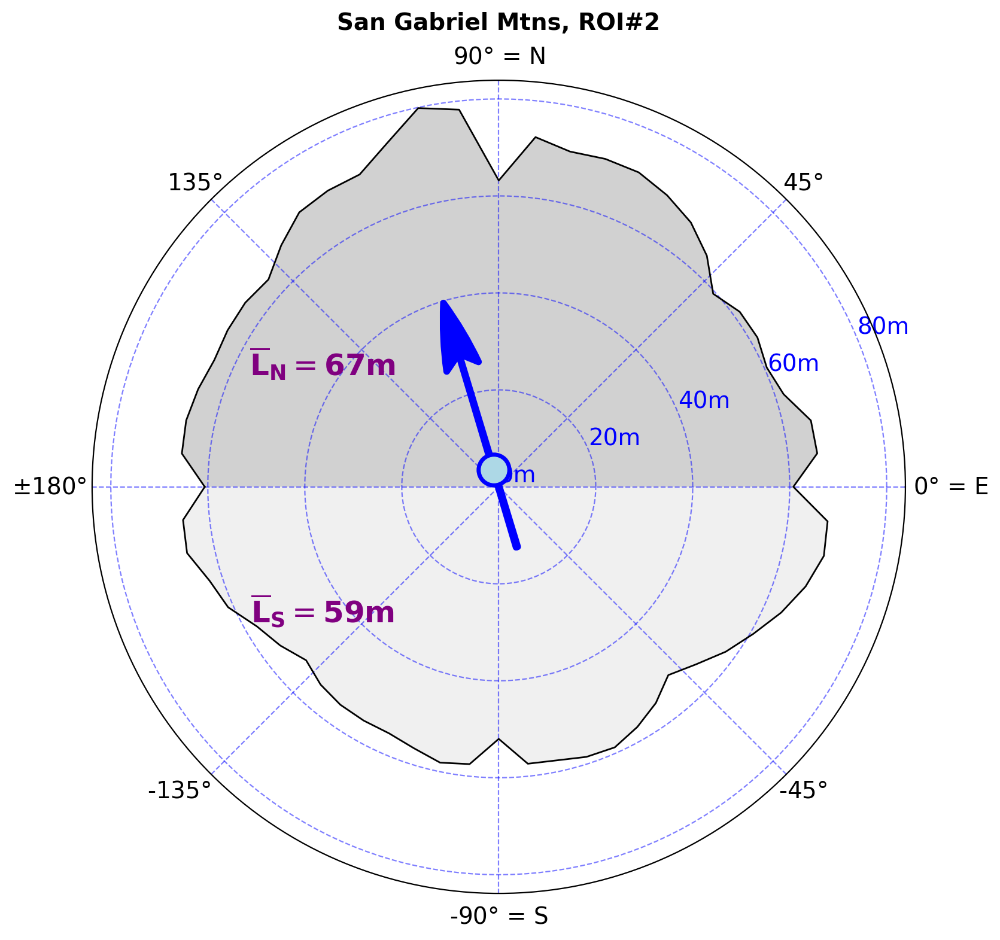

In [22]:
sl.plot.plot_hsl_aspect_distribution(window_size_factor=3)

## Hillslope length stats

Plotting hillslope length distributions...
Recording figure "hsl_nsall_distbn"
Recording figure "hsl_ns_qq"
Recording figure "hsl_ns_pp"


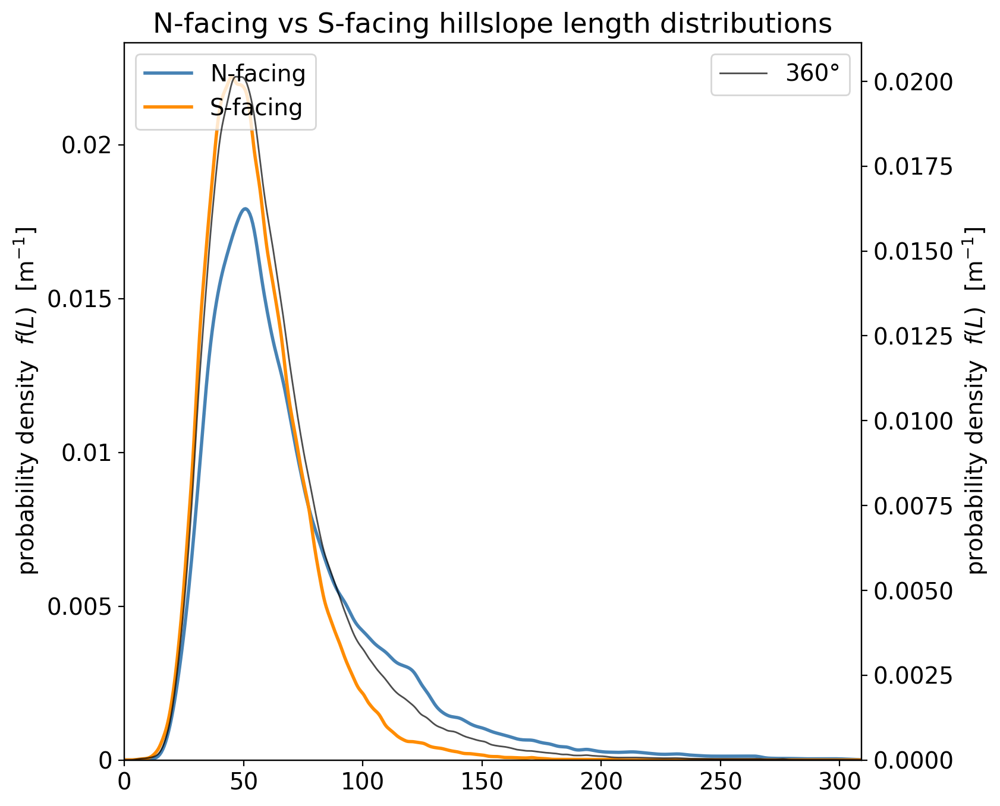

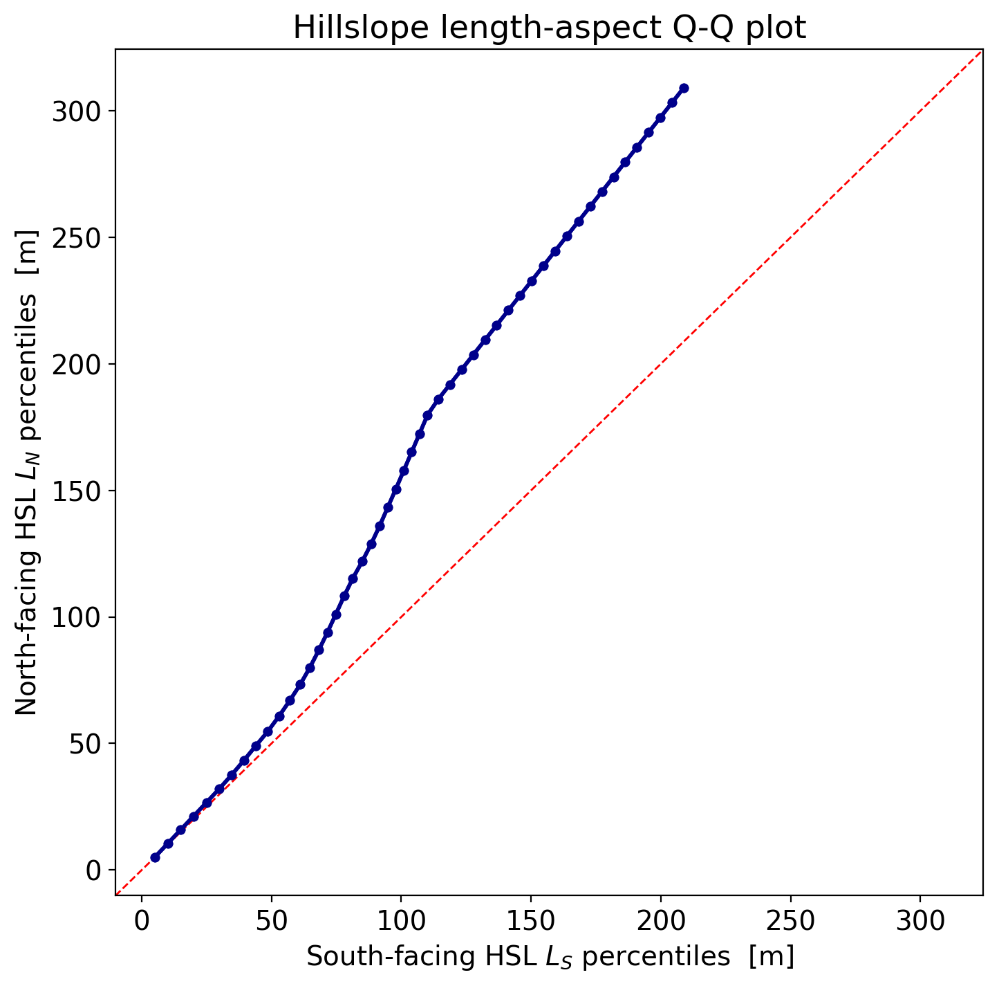

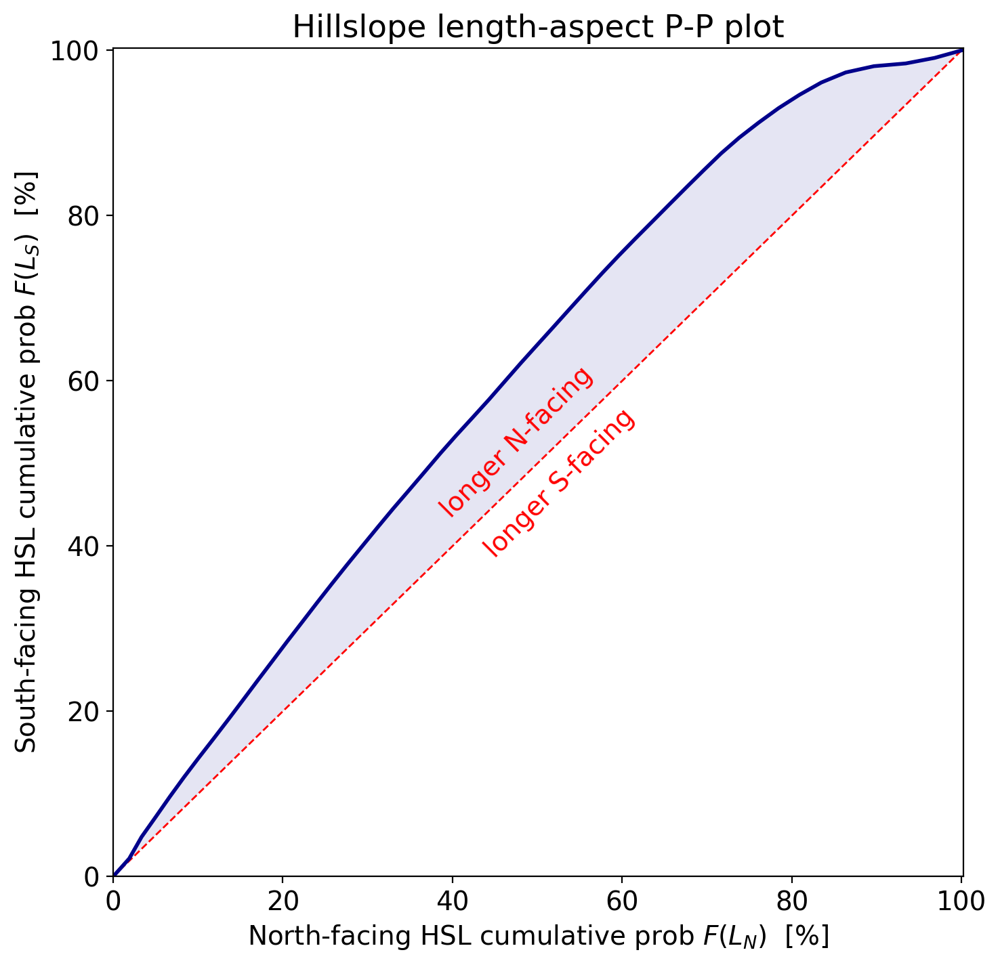

In [23]:
sl.plot.plot_hsl_distributions()

In [24]:
df = sl.mapping.hsl_stats_df
df[:30].style.format("{:.3g}").set_properties(**{'font-size':'140%'}) \
         .set_caption('Hillslope length statistics:')
df.mean()

,,count,mean [m],stddev [m]
fine,coarse,,,


count        NaN
mean [m]     NaN
stddev [m]   NaN
dtype: float64

## Export plots

In [25]:
sl.plot.figs

{'roi_shaded_relief': <Figure size 810x810 with 1 Axes>,
 'streamlines': <Figure size 900x900 with 1 Axes>,
 'channels': <Figure size 900x900 with 1 Axes>,
 'label': <Figure size 900x900 with 1 Axes>,
 'hsl': <Figure size 990x990 with 2 Axes>,
 'hsl_contours': <Figure size 900x900 with 2 Axes>,
 'aspect': <Figure size 945x945 with 2 Axes>,
 'hsl_aspect_distribution': <Figure size 900x900 with 1 Axes>,
 'hsl_nsall_distbn': <Figure size 800x800 with 2 Axes>,
 'hsl_ns_qq': <Figure size 810x810 with 1 Axes>,
 'hsl_ns_pp': <Figure size 810x810 with 1 Axes>}

In [26]:
sl.save.do()


**Write results to files begin**
Saving maps...
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_dtm_mask.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_uv.tif (4956, 5504, 2)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_slope.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_mapping.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_coarse_subsegment.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_merged_coarse_mask.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_hsl.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_hsl_smoothed.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/SanGabrielMtns2/SanGabrielMtns2_aspect.tif (4956, 5504)
/Users/colinstark/Work/Streamlines/slmxpt/